In [20]:
library(Seurat)
library(tidyverse)
library(patchwork)
options(tibble.print_max = 200, width=200)

Attaching SeuratObject



In [ ]:
xenium.obj = qs::qread('_targets/objects/obj_merged')
xenium.obj

In [2]:
source('../00_preprocessing/preprocessing.R')

In [32]:
obj_fgf1 = qs::qread('../genebasisr_obob5v5/_targets/objects/exp_all_n1xo')
obj_fgf1

An object of class Seurat 
57395 features across 27188 samples within 3 assays 
Active assay: SCT (25074 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [31]:
obj_fgf1 %>% `[[` %>% head

,orig.ident,nCount_RNA,nFeature_RNA,Index.10x,nCount_HTO,nFeature_HTO,Index.HTO,nCount_spliced,nFeature_spliced,nCount_unspliced,⋯,collection_date,isolation_date,batch,predicted.id,prediction.score.max,labels,cell_class,polar_label,nCount_integrated,nFeature_integrated
,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<int>
TTCTAGTGTTAACCTG_3_3,SI-TT-C12,36340,5631,SI-TT-C12,1151,12,D706,4463,2244,31877,⋯,211213,24/6/2022,Batch 3,Nr5a1_Bdnf,1.0000000,Nr5a1_Bdnf,neuron,Nr5a1_Bdnf.none,0,0
AAGCCATCACTGGACC_1_3,SI-TT-A12,24323,5032,SI-TT-A12,911,12,D704,3657,1985,20666,⋯,220329,24/6/2022,Batch 3,Gpr50,0.4365543,Gpr50,neuron,Gpr50.none,0,0
TAGGTACAGACCGTTT_1_3,SI-TT-A12,36414,5761,SI-TT-A12,1054,12,D704,4686,2364,31728,⋯,220329,24/6/2022,Batch 3,Nr5a1_Bdnf,0.9720783,Nr5a1_Bdnf,neuron,Nr5a1_Bdnf.none,0,0
TTCGATTGTGGCTAGA_2_3,SI-TT-B12,16870,4301,SI-TT-B12,813,12,D705,2917,1616,13953,⋯,220328,24/6/2022,Batch 3,Unassigned1,0.5512957,Unassigned1.sc39,neuron,Unassigned1.sc39.none,0,0
ATTCATCCATACAGAA_1_2,SI-TT-C11,29289,5126,SI-TT-C11,907,12,D707,3493,1903,25796,⋯,211213,23/6/2022,Batch 2,Unassigned1,0.7526640,Unassigned1.sc17.sc28,neuron,Unassigned1.sc17.sc28.none,0,0
CTAACTTCAAAGGCTG_2_3,SI-TT-B12,37702,5828,SI-TT-B12,874,12,D705,4755,2399,32947,⋯,220329,24/6/2022,Batch 3,Pomc_Glipr1,0.8351124,Pomc_Glipr1-Slc17a6_Trhr,neuron,Pomc_Glipr1__Slc17a6_Trhr.none,0,0


# All Xe genes integ

In [33]:
xenium.obj = qs::qread('xenium.obj.qs')
xenium.obj

An object of class Seurat 
500 features across 78054 samples within 5 assays 
Active assay: SCT (100 features, 100 variable features)
 4 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe
 1 dimensional reduction calculated: umap
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

In [34]:
xenium_genes = xenium.obj@assays$Xenium@meta.features %>% rownames
ref_genes = obj_fgf1@assays$SCT@meta.features %>% rownames
xenium_genes = xenium_genes %>% intersect(ref_genes)
xenium_genes = xenium_genes %>% tibble %>% filter(. != 'Lmx1a') %>% filter(. != 'Agrp') %>% pull

length(xenium_genes)
xenium_genes

[1] 98

[1] "Sorcs1"   "Lingo2"   "Cntn4"    "Tenm2"    "Sox5"     "Ptprd"    "Robo1"    "Plcl1"    "Oxr1"     "Plxdc2"   "Plp1"     "Kirrel3"  "Mgat4c"   "Tenm3"    "Slit2"    "Nrg3"     "Hdac9"   
[18] "Col25a1"  "Ncam2"    "Rbfox1"   "Fgf13"    "Pde10a"   "Deptor"   "Alcam"    "Gria1"    "Grid2"    "Grm7"     "Agrp"     "Naaladl2" "Ntm"      "Gpc5"     "Hs3st4"   "Lef1"     "Erbb4"   
[35] "Kctd16"   "Zfhx3"    "Gtdc1"    "Pdgfra"   "Nrg1"     "Macrod2"  "Gpc6"     "Pcdh11x"  "Kcnip4"   "Brinp3"   "Cadm2"    "Pde4b"    "Fhit"     "Rgs6"     "Prkg1"    "Dlg2"     "Ptprk"   
[52] "Luzp2"    "Ptprt"    "Nxph1"    "Kcnq3"    "Lrmda"    "Dcc"      "Cntn5"    "Adarb2"   "Gabrg3"   "Rmst"     "Lrp1b"    "Trpm3"    "P3h2"     "Prr16"    "Prkca"    "Nrxn3"    "Aqp4"    
[69] "Ctnna2"   "Inpp4b"   "Sgcz"     "Fat3"     "Plcb1"    "Cacna2d3" "Bmp4"     "Tox"      "Car10"    "Nkain2"   "Galntl6"  "Slc7a11"  "Pcdh9"    "Slc1a2"   "Pdzrn3"   "Rax"      "Pomc"    
[86] "Zfp804b"  "Wwox"     "Pcdh7"    "Grm8"     "Rtl4"     "Il1rapl2" "Sgcd"     "Egfem1"   "Arhgap6"  "Immp2l"   "Cfap299"  "Htr3b"    "Csmd1"

In [35]:
obj_fgf1 = obj_fgf1 %>% Seurat::RunUMAP(assay='SCT', slot='counts', features = xenium_genes, return.model = TRUE)
obj_fgf1 %>% qs::qsave('obj_fgf1_obob5v5.qs')
obj_fgf1

UMAP will return its model

17:49:02 UMAP embedding parameters a = 0.9922 b = 1.112

17:49:02 Read 27188 rows and found 98 numeric columns

17:49:02 Using Annoy for neighbor search, n_neighbors = 30

17:49:02 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

17:49:07 Writing NN index file to temp file /scratch/nmq407/R_tmp//RtmpAIesKm/file16158647baf38

17:49:07 Searching Annoy index using 1 thread, search_k = 3000

17:49:18 Annoy recall = 100%

17:49:21 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

17:49:25 Initializing from normalized Laplacian + noise (using irlba)

17:49:30 Commencing optimization for 200 epochs, with 1183220 positive edges

17:50:04 Optimization finished



An object of class Seurat 
57395 features across 27188 samples within 3 assays 
Active assay: SCT (25074 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [36]:
# anchors = FindIntegrationAnchors(obj_list, assay=c('SCT', 'SCT'), anchor.features=xenium_genes)
anchors <- FindTransferAnchors(reference = obj_fgf1, query = xenium.obj, features = xenium_genes,  
                               normalization.method = 'SCT',
                               reduction = 'pcaproject',
                               query.assay = 'SCT',
                               reference.assay = 'SCT',
                               recompute.residuals = F,
                               reference.reduction='pca',
                               verbose=TRUE)

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Projecting cell embeddings

Finding neighborhoods

Finding anchors

	Found 11436 anchors



In [37]:
xenium.obj_unimapped <- MapQuery(anchorset = anchors, reference = obj_fgf1, query = xenium.obj,
                                 refdata = list(polar_label = "polar_label"), reduction.model = "umap")

Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorepolar_label_ to predictionscorepolarlabel_”

Integrating dataset 2 with reference dataset

Finding integration vectors

Integrating data

Computing nearest neighbors

Running UMAP projection

18:03:46 Read 78054 rows

18:03:46 Processing block 1 of 1

18:03:46 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

18:03:48 Initializing by weighted average of neighbor coordinates using 1 thread

18:03:48 Commencing optimization for 67 epochs, with 2341620 positive edges

18:04:14 Finished



In [38]:
qs::qsave(xenium.obj_unimapped, '230710_xenium_sct_unimapped_polar_label.qs')

In [39]:
# anchors = FindIntegrationAnchors(obj_list, assay=c('SCT', 'SCT'), anchor.features=xenium_genes)
anchors_cca <- FindTransferAnchors(reference = obj_fgf1, query = xenium.obj, features = xenium_genes,  
                               normalization.method = 'SCT',
                               reduction = 'cca',
                               query.assay = 'SCT',
                               reference.assay = 'SCT',
                               recompute.residuals = F,
                               verbose=TRUE)

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 49750 anchors



In [44]:
xenium.obj_unimapped_cca <- MapQuery(anchorset = anchors_cca, reference = obj_fgf1, query = xenium.obj,
                                 refdata = list(cell_class = "cell_class"), reduction.model = "umap")

Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorecell_class_ to predictionscorecellclass_”
Computing nearest neighbors

Running UMAP projection

20:43:14 Read 78054 rows

20:43:14 Processing block 1 of 1

20:43:14 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

20:43:16 Initializing by weighted average of neighbor coordinates using 1 thread

20:43:17 Commencing optimization for 67 epochs, with 2341620 positive edges

20:43:52 Finished



In [ ]:
qs::qsave(xenium.obj_unimapped_cca, '230710_xenium_sct_unimapped_cca_polar_label.qs')

In [63]:
xe_neuron_cells = xenium.obj_unimapped_cca %>% 
`[[` %>% 
filter(predicted.cell_class == 'neuron') %>%
rownames
length(xe_neuron_cells)

xe_other_cells = xenium.obj_unimapped_cca %>% 
`[[` %>% 
filter(predicted.cell_class != 'neuron') %>%
rownames
length(xe_other_cells)

[1] 50182

[1] 27872

In [47]:
xe_neurons_obj = xenium.obj_unimapped_cca %>%
subset(cells = xe_neuron_cells) %>%
Seurat::SCTransform(assay='Xenium',
                    method="glmGamPoi",
                    vst.flavor="v2",
                    verbose=TRUE) %>%
Seurat::RunUMAP(assay='SCT', slot='counts', features = xenium_genes, return.model = TRUE)
xe_neurons_obj

vst.flavor='v2' set, setting model to use fixed slope and exclude poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Total Step 1 genes: 100

Total overdispersed genes: 100

Excluding 0 genes from Step 1 because they are not overdispersed.

Variance stabilizing transformation of count matrix of size 100 by 50182

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 100 genes, 5000 cells



  |==============================================================================================================================================================================================| 100%


Setting estimate of  2 genes to inf as theta_mm/theta_mle < 1e-3

# of step1 poisson genes (variance < mean): 0

# of low mean genes (mean < 0.001): 1

Total # of Step1 poisson genes (theta=Inf; variance < mean): 2

Total # of poisson genes (theta=Inf; variance < mean): 1

Calling offset model for all 1 poisson genes

Found 2 outliers - those will be ignored in fitting/regularization step


Ignoring theta inf genes

Replacing fit params for 1 poisson genes by theta=Inf

Setting min_variance based on median UMI:  0.16

Second step: Get residuals using fitted parameters for 100 genes



  |==============================================================================================================================================================================================| 100%


Computing corrected count matrix for 100 genes



  |==============================================================================================================================================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 10.46456 secs

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..SCTransform.Xenium; see ?make.names for more details on syntax validity”
UMAP will return its model

23:03:55 UMAP embedding parameters a = 0.9922 b = 1.112

23:03:55 Read 50182 rows and found 98 numeric columns

23:03:55 Using Annoy for neighbor search, n_neighbors = 30

23:03:55 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

23:04:04 Writing NN index file to temp file /scratch/nmq407/R_tmp//RtmpAIesKm/file16158101ee992

23:04:04 Searching Annoy index using 1 

An object of class Seurat 
502 features across 50182 samples within 6 assays 
Active assay: SCT (100 features, 100 variable features)
 5 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe, prediction.score.cell_class
 3 dimensional reductions calculated: umap, cca, ref.umap
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

In [64]:
obj_fgf1_neurons = qs::qread('../genebasisr_obob5v5/_targets/objects/exp_neuron_obob5v5') %>% 
Seurat::RunUMAP(assay='SCT', slot='counts', features = xenium_genes, return.model = TRUE)
obj_fgf1_neurons

UMAP will return its model

00:16:16 UMAP embedding parameters a = 0.9922 b = 1.112

00:16:16 Read 44641 rows and found 98 numeric columns

00:16:16 Using Annoy for neighbor search, n_neighbors = 30

00:16:16 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

00:16:24 Writing NN index file to temp file /scratch/nmq407/R_tmp//RtmpAIesKm/file16158544f2a58

00:16:24 Searching Annoy index using 1 thread, search_k = 3000

00:16:54 Annoy recall = 100%

00:16:57 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

00:17:01 Initializing from normalized Laplacian + noise (using irlba)

00:17:09 Commencing optimization for 200 epochs, with 1873118 positive edges

00:18:04 Optimization finished



An object of class Seurat 
58321 features across 44641 samples within 3 assays 
Active assay: SCT (26000 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [65]:
# anchors = FindIntegrationAnchors(obj_list, assay=c('SCT', 'SCT'), anchor.features=xenium_genes)
anchors_cca <- FindTransferAnchors(reference = obj_fgf1_neurons, query = xe_neurons_obj, features = xenium_genes,  
                               normalization.method = 'SCT',
                               reduction = 'cca',
                               query.assay = 'SCT',
                               reference.assay = 'SCT',
                               recompute.residuals = F,
                               verbose=TRUE)

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 66310 anchors



In [66]:
xe_neurons_obj <- MapQuery(anchorset = anchors_cca, reference = obj_fgf1_neurons, query = xe_neurons_obj,
                                 refdata = list(polar_label = "polar_label"), reduction.model = "umap")

Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorepolar_label_ to predictionscorepolarlabel_”
Computing nearest neighbors

Running UMAP projection

00:25:01 Read 50182 rows

00:25:01 Processing block 1 of 1

00:25:01 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

00:25:02 Initializing by weighted average of neighbor coordinates using 1 thread

00:25:02 Commencing optimization for 67 epochs, with 1505460 positive edges

00:25:25 Finished



In [67]:
xe_neurons_obj %>% qs::qsave('xe_neurons_obj.qs')
obj_fgf1_neurons %>% qs::qsave('obj_fgf1_neurons.qs')

Warning message:
“ggrepel: 27 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 1 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


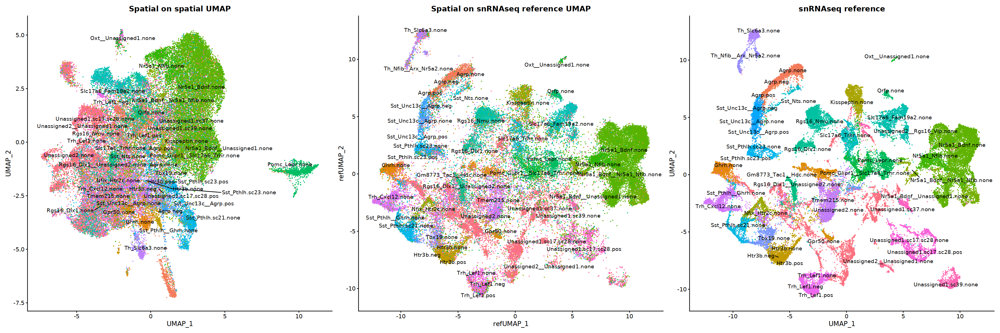

In [68]:
p1 = DimPlot(xe_neurons_obj, reduction = "umap", group.by = "predicted.polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none")  + labs(title = "Spatial on spatial UMAP")
p2 = DimPlot(xe_neurons_obj, reduction = "ref.umap", group.by = "predicted.polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "Spatial on snRNAseq reference UMAP")
p3 = DimPlot(obj_fgf1_neurons, reduction = "umap", group.by = "polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "snRNAseq reference")
options(repr.plot.width=30, repr.plot.height=10)
p1 + p2 + p3

In [69]:
xe_other_obj = xenium.obj_unimapped_cca %>%
subset(cells = xe_other_cells) %>%
Seurat::SCTransform(assay='Xenium',
                    method="glmGamPoi",
                    vst.flavor="v2",
                    verbose=TRUE) %>%
Seurat::RunUMAP(assay='SCT', slot='counts', features = xenium_genes, return.model = TRUE)
xe_other_obj

vst.flavor='v2' set, setting model to use fixed slope and exclude poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Total Step 1 genes: 99

Total overdispersed genes: 99

Excluding 0 genes from Step 1 because they are not overdispersed.

Variance stabilizing transformation of count matrix of size 100 by 27872

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 99 genes, 5000 cells



  |==============================================================================================================================================================================================| 100%


Setting estimate of  0 genes to inf as theta_mm/theta_mle < 1e-3

# of step1 poisson genes (variance < mean): 0

# of low mean genes (mean < 0.001): 1

Total # of Step1 poisson genes (theta=Inf; variance < mean): 0

Total # of poisson genes (theta=Inf; variance < mean): 1

Calling offset model for all 1 poisson genes

Found 1 outliers - those will be ignored in fitting/regularization step


Ignoring theta inf genes

Replacing fit params for 1 poisson genes by theta=Inf

Setting min_variance based on median UMI:  0.16

Second step: Get residuals using fitted parameters for 100 genes



  |==============================================================================================================================================================================================| 100%


Computing corrected count matrix for 100 genes



  |==============================================================================================================================================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 9.455013 secs

Determine variable features

Place corrected count matrix in counts slot

Centering data matrix

Set default assay to SCT

Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is Seurat..SCTransform.Xenium; see ?make.names for more details on syntax validity”
UMAP will return its model

00:28:37 UMAP embedding parameters a = 0.9922 b = 1.112

00:28:37 Read 27872 rows and found 98 numeric columns

00:28:37 Using Annoy for neighbor search, n_neighbors = 30

00:28:37 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

00:28:45 Writing NN index file to temp file /scratch/nmq407/R_tmp//RtmpAIesKm/file161582c01f7f0

00:28:45 Searching Annoy index using 1 

An object of class Seurat 
502 features across 27872 samples within 6 assays 
Active assay: SCT (100 features, 100 variable features)
 5 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe, prediction.score.cell_class
 3 dimensional reductions calculated: umap, cca, ref.umap
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

In [70]:
obj_fgf1_other = qs::qread('../genebasisr_obob5v5/_targets/objects/exp_other_obob5v5') %>% 
Seurat::RunUMAP(assay='SCT', slot='counts', features = xenium_genes, return.model = TRUE)
obj_fgf1_other

UMAP will return its model

00:30:10 UMAP embedding parameters a = 0.9922 b = 1.112

00:30:10 Read 13594 rows and found 98 numeric columns

00:30:10 Using Annoy for neighbor search, n_neighbors = 30

00:30:10 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

00:30:12 Writing NN index file to temp file /scratch/nmq407/R_tmp//RtmpAIesKm/file161586f4c2475

00:30:12 Searching Annoy index using 1 thread, search_k = 3000

00:30:17 Annoy recall = 100%

00:30:20 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

00:30:24 Initializing from normalized Laplacian + noise (using irlba)

00:30:25 Commencing optimization for 200 epochs, with 626738 positive edges

00:30:44 Optimization finished



An object of class Seurat 
54939 features across 13594 samples within 3 assays 
Active assay: SCT (22618 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [71]:
# anchors = FindIntegrationAnchors(obj_list, assay=c('SCT', 'SCT'), anchor.features=xenium_genes)
anchors_cca <- FindTransferAnchors(reference = obj_fgf1_other, query = xe_other_obj, features = xenium_genes,  
                               normalization.method = 'SCT',
                               reduction = 'cca',
                               query.assay = 'SCT',
                               reference.assay = 'SCT',
                               recompute.residuals = F,
                               verbose=TRUE)

Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Warning message:
“Adding image data that isn't associated with any assay present”
Running CCA

Merging objects

Finding neighborhoods

Finding anchors

	Found 26537 anchors



In [72]:
xe_other_obj <- MapQuery(anchorset = anchors_cca, reference = obj_fgf1_other, query = xe_other_obj,
                                 refdata = list(polar_label = "polar_label"), reduction.model = "umap")

Finding integration vectors

Finding integration vector weights

Predicting cell labels

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Keys should be one or more alphanumeric characters followed by an underscore, setting key from predictionscorepolar_label_ to predictionscorepolarlabel_”
Computing nearest neighbors

Running UMAP projection

00:34:06 Read 27872 rows

00:34:06 Processing block 1 of 1

00:34:06 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors = 30

00:34:07 Initializing by weighted average of neighbor coordinates using 1 thread

00:34:07 Commencing optimization for 67 epochs, with 836160 positive edges

00:34:20 Finished



In [73]:
xe_other_obj %>% qs::qsave('xe_other_obj.qs')
obj_fgf1_other %>% qs::qsave('obj_fgf1_other.qs')

Warning message:
“ggrepel: 17 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 6 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


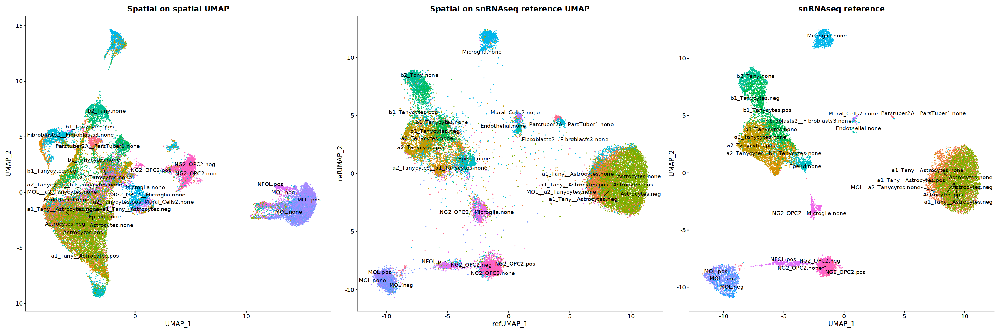

In [74]:
p1 = DimPlot(xe_other_obj, reduction = "umap", group.by = "predicted.polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none")  + labs(title = "Spatial on spatial UMAP")
p2 = DimPlot(xe_other_obj, reduction = "ref.umap", group.by = "predicted.polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "Spatial on snRNAseq reference UMAP")
p3 = DimPlot(obj_fgf1_other, reduction = "umap", group.by = "polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "snRNAseq reference")
options(repr.plot.width=30, repr.plot.height=10)
p1 + p2 + p3

In [79]:
meta_other = xe_other_obj %>% 
`[[` %>%
select(predicted.cell_class.score, predicted.cell_class, 
       predicted.polar_label.score, predicted.polar_label) %>%
  rename_with(~paste0(., "_2s"), everything())

meta_neurons = xe_neurons_obj %>% 
`[[` %>%
select(predicted.cell_class.score, predicted.cell_class, 
       predicted.polar_label.score, predicted.polar_label) %>%
  rename_with(~paste0(., "_2s"), everything())

meta_new = rbind(meta_other, meta_neurons)

In [82]:
xenium.obj_unimapped_cca_2s = xenium.obj_unimapped_cca %>% AddMetaData(metadata = meta_new)
xenium.obj_unimapped_cca_2s %>% `[[` 
qs::qsave(xenium.obj_unimapped_cca_2s, '230710_xenium_sct_unimapped_cca_polar_label.qs')

,orig.ident,nCount_Xenium,nFeature_Xenium,nCount_BlankCodeword,nFeature_BlankCodeword,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,cell_area,⋯,strain,time,nCount_SCT,nFeature_SCT,predicted.cell_class.score,predicted.cell_class,predicted.cell_class.score_2s,predicted.cell_class_2s,predicted.polar_label.score_2s,predicted.polar_label_2s
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,⋯,<chr>,<chr>,<dbl>,<int>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<chr>
Cell10000_9129_13312_1,SeuratProject,113,38,0,0,0,0,0,0,1271.0,⋯,obob,obob,115,38,1.0000000,neuron,1.0000000,neuron,0.3306848,Kisspeptin.none
Cell10001_7423_16733_1,SeuratProject,31,18,0,0,0,0,0,0,467.0,⋯,obob,obob,101,30,0.9373196,neuron,0.9373196,neuron,0.2402464,Th_Slc6a3.none
Cell10002_2432_2392_1,SeuratProject,62,28,0,0,0,0,0,0,1197.0,⋯,obob,obob,115,28,1.0000000,neuron,1.0000000,neuron,0.2767669,Sst_Unc13c__Agrp.none
Cell10003_8358_77_1,SeuratProject,123,32,0,0,0,0,0,0,2649.0,⋯,obob,obob,123,32,1.0000000,neuron,1.0000000,neuron,0.3907511,Kisspeptin.none
Cell10004_9190_600_1,SeuratProject,93,35,0,0,0,0,0,0,2361.0,⋯,obob,obob,114,35,0.9933383,neuron,0.9933383,neuron,0.1657573,Unassigned2.none
Cell10006_3751_1404_1,SeuratProject,240,54,0,0,0,0,0,0,3947.0,⋯,obob,obob,124,43,0.9610168,neuron,0.9610168,neuron,0.3265612,Htr3b.none
Cell10007_5614_2509_1,SeuratProject,126,43,0,0,0,0,0,0,1756.0,⋯,obob,obob,126,43,0.6016963,other,0.6016963,other,0.3179187,Astrocytes.none
Cell10008_4292_3239_1,SeuratProject,115,37,0,0,0,0,0,0,1989.0,⋯,obob,obob,115,37,1.0000000,neuron,1.0000000,neuron,0.4244611,Pomc_Lepr.none
Cell10009_2592_11577_1,SeuratProject,48,25,0,0,0,0,0,0,981.5,⋯,obob,obob,98,26,1.0000000,neuron,1.0000000,neuron,0.5687612,Th_Slc6a3.none


Warning message:
“ggrepel: 51 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 53 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 52 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


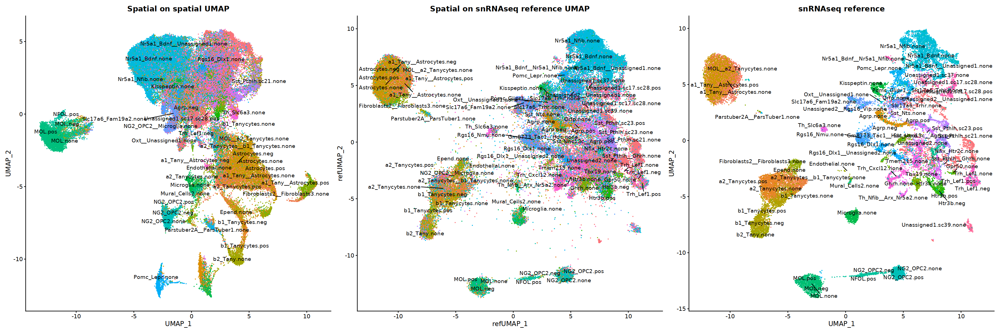

In [84]:
p1 = DimPlot(xenium.obj_unimapped_cca_2s, reduction = "umap", group.by = "predicted.polar_label_2s", label = TRUE, repel = TRUE) + theme(legend.position = "none")  + labs(title = "Spatial on spatial UMAP")
p2 = DimPlot(xenium.obj_unimapped_cca_2s, reduction = "ref.umap", group.by = "predicted.polar_label_2s", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "Spatial on snRNAseq reference UMAP")
p3 = DimPlot(obj_fgf1, reduction = "umap", group.by = "polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "snRNAseq reference")
options(repr.plot.width=30, repr.plot.height=10)
p1 + p2 + p3

Warning message:
“ggrepel: 36 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 42 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 52 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


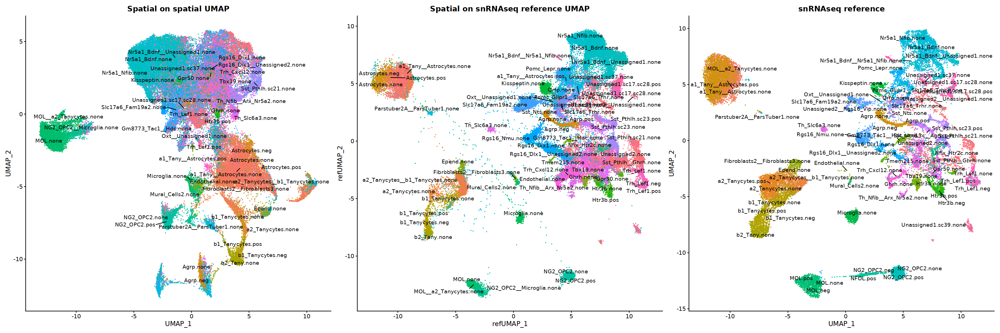

In [86]:
p1 = DimPlot(xenium.obj_unimapped, reduction = "umap", group.by = "predicted.polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none")  + labs(title = "Spatial on spatial UMAP")
p2 = DimPlot(xenium.obj_unimapped, reduction = "ref.umap", group.by = "predicted.polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "Spatial on snRNAseq reference UMAP")
p3 = DimPlot(obj_fgf1, reduction = "umap", group.by = "polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "snRNAseq reference")
options(repr.plot.width=30, repr.plot.height=10)
p1 + p2 + p3

In [3]:
library(tidyverse)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   0.3.4
✔ tibble  3.2.1     ✔ dplyr   1.1.2
✔ tidyr   1.2.1     ✔ stringr 1.4.1
✔ readr   2.1.2     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


In [7]:
meta = targets::tar_meta()

In [30]:
targets::tar_meta() %>% filter(name == 'xe_neuron_cells')

name,type,data,command,depend,seed,path,time,size,bytes,format,repository,iteration,parent,children,seconds,warnings,error
<chr>,<chr>,<chr>,<chr>,<chr>,<int>,<list>,<dttm>,<chr>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<list>,<dbl>,<chr>,<chr>
xe_neuron_cells,stem,error,454735c556b05abd,750d095b0c0f3451,-532007427,NA,2023-08-01 22:07:38,de1c6d017cb4e8a8,38,qs,local,vector,NA,NA,4.822,NA,object xe_obj_cca_unimapped not found


In [18]:
rgs_markers = qs::qread('_targets/objects/all_markers_xe_cca_unimapped_2s') %>% filter(cluster == 'Rgs16_Dlx1') %>% pull(gene) %>% head

In [23]:
qs::qread('_targets/objects/all_markers_xe_cca_unimapped_2s') %>% filter(cluster == 'Rgs16_Dlx1')

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Fgf13.28,1.716146e-209,1.5440114,0.966,0.693,1.716146e-207,Rgs16_Dlx1,Fgf13
Nrxn3.37,1.021514e-180,1.3592962,0.992,0.823,1.021514e-178,Rgs16_Dlx1,Nrxn3
Galntl6.19,2.458960e-120,0.8250595,0.558,0.183,2.458960e-118,Rgs16_Dlx1,Galntl6
Dlg2.23,2.035648e-44,0.4642144,0.963,0.859,2.035648e-42,Rgs16_Dlx1,Dlg2
Hs3st4.34,1.337574e-38,-0.8479241,0.249,0.517,1.337574e-36,Rgs16_Dlx1,Hs3st4
Mgat4c.19,2.332841e-36,0.4810351,0.596,0.353,2.332841e-34,Rgs16_Dlx1,Mgat4c
Grm8.27,9.951392e-30,-0.6096302,0.199,0.441,9.951392e-28,Rgs16_Dlx1,Grm8
Ncam2.25,1.921313e-29,0.5227135,0.925,0.895,1.921313e-27,Rgs16_Dlx1,Ncam2
Deptor.28,2.315359e-29,-0.7100404,0.199,0.432,2.315359e-27,Rgs16_Dlx1,Deptor


In [15]:
xe_obj = qs::qread('_targets/objects/xe_obj_cca_unimapped_2s')

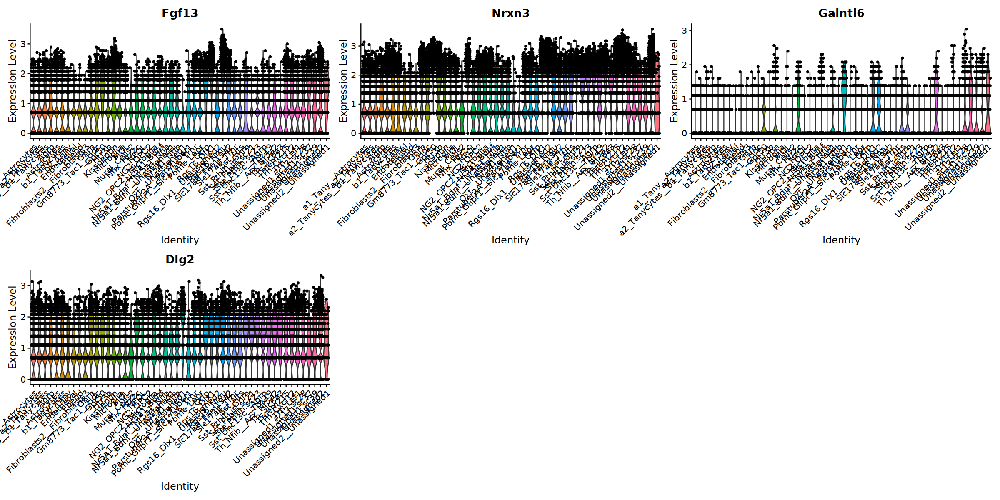

In [27]:
options(repr.plot.width=20, repr.plot.height=10)
xe_obj %>% VlnPlot(features = c('Fgf13', 'Nrxn3', 'Galntl6', 'Dlg2'), group.by = 'predicted.label') + theme(legend.position = "none")

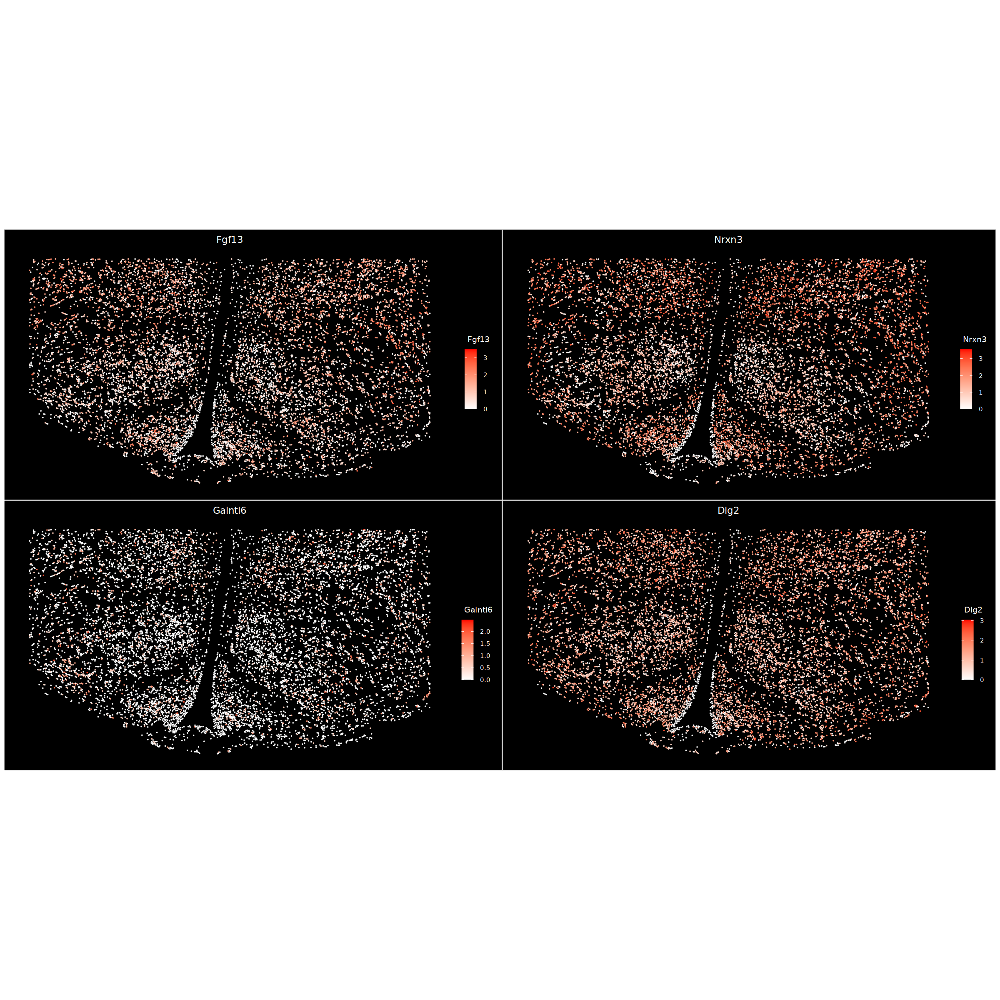

In [29]:
options(repr.plot.width=20, repr.plot.height=20)
ImageFeaturePlot(xe_obj, features = c('Fgf13', 'Nrxn3', 'Galntl6', 'Dlg2'), fov='fov.6', max.cutoff = c(25,
    35, 12, 10), size = 0.75, cols = c("white", "red"))

In [99]:
xe_obj = qs::qread('_targets/objects/xe_obj_cca_td_other_labels')

In [100]:
xe_obj

An object of class Seurat 
499 features across 15957 samples within 5 assays 
Active assay: SCT (99 features, 99 variable features)
 4 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe
 1 dimensional reduction calculated: umap
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

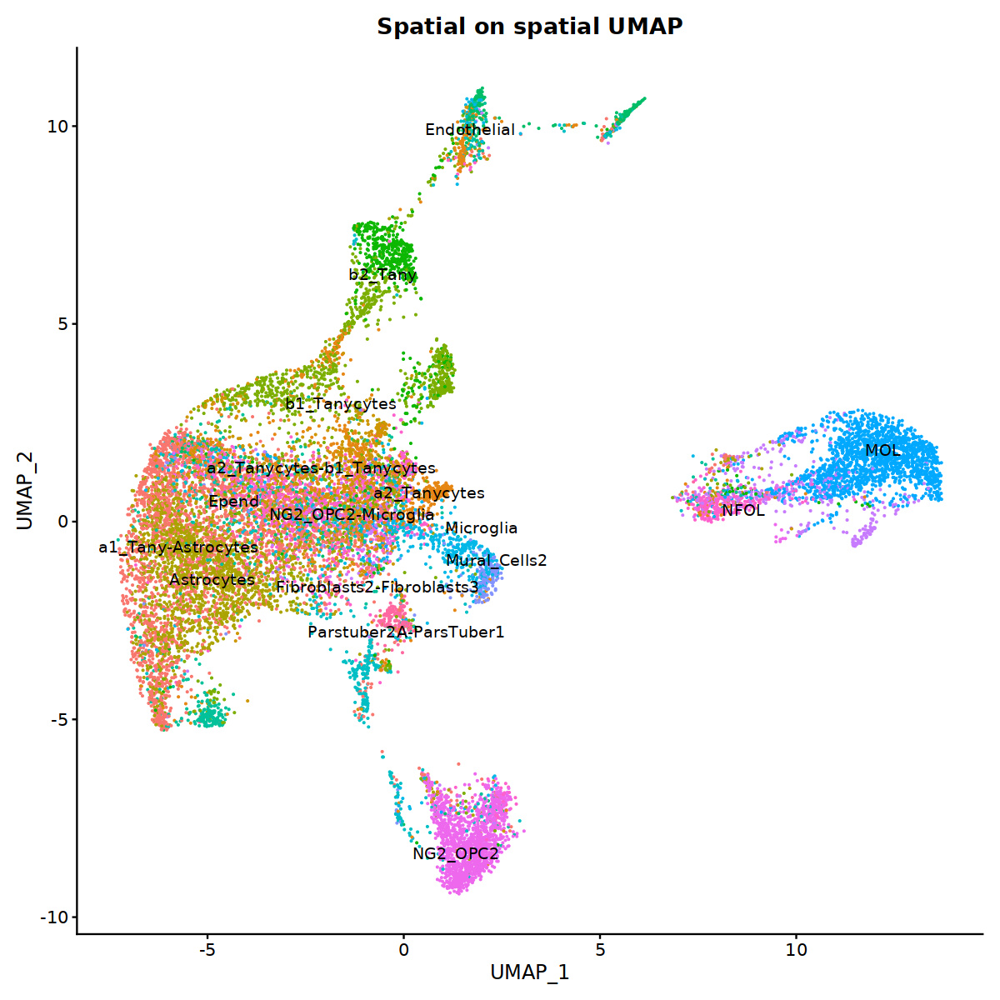

In [101]:
options(repr.plot.width=10, repr.plot.height=10)
p1 = DimPlot(xe_obj, reduction = "umap", group.by = "labels", label = TRUE, repel = TRUE) + theme(legend.position = "none")  + labs(title = "Spatial on spatial UMAP")
p1

In [97]:
xe_obj = qs::qread('_targets/objects/xe_obj_cca_td_00')
xe_obj
xe_obj %>% `[[` %>% head

An object of class Seurat 
500 features across 63884 samples within 5 assays 
Active assay: SCT (100 features, 100 variable features)
 4 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

,orig.ident,nCount_Xenium,nFeature_Xenium,nCount_BlankCodeword,nFeature_BlankCodeword,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,cell_area,⋯,avg_confidence,nucleus_area,sample_name,treatment,strain,time,nCount_SCT,nFeature_SCT,predicted.id,prediction.score.max
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,⋯,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<chr>,<dbl>
Cell10000_9129_13312_1,SeuratProject,113,38,0,0,0,0,0,0,1271,⋯,0.9961,NA,A1,Veh_PF,obob,obob,126,38,neuron,1.0000000
Cell10001_7423_16733_1,SeuratProject,31,18,0,0,0,0,0,0,467,⋯,0.9906,NA,A1,Veh_PF,obob,obob,119,40,neuron,1.0000000
Cell10002_2432_2392_1,SeuratProject,62,28,0,0,0,0,0,0,1197,⋯,0.9928,NA,A1,Veh_PF,obob,obob,123,28,neuron,1.0000000
Cell10004_9190_600_1,SeuratProject,93,35,0,0,0,0,0,0,2361,⋯,0.9907,NA,A1,Veh_PF,obob,obob,125,35,neuron,1.0000000
Cell10005_10135_15550_1,SeuratProject,14,11,0,0,0,0,0,0,124,⋯,0.9916,NA,A1,Veh_PF,obob,obob,124,63,other,0.9110529
Cell10006_3751_1404_1,SeuratProject,240,54,0,0,0,0,0,0,3947,⋯,0.9929,NA,A1,Veh_PF,obob,obob,137,48,other,0.9480905


In [98]:
options(repr.plot.width=10, repr.plot.height=10)
p1 = DimPlot(xe_obj, reduction = "umap", group.by = "predicted.id", label = TRUE, repel = TRUE) + theme(legend.position = "none")  + labs(title = "Spatial on spatial UMAP")
p1

ERROR: Error: Cannot find 'umap' in this Seurat object


In [45]:
xe_obj

An object of class Seurat 
502 features across 39238 samples within 6 assays 
Active assay: SCT (100 features, 100 variable features)
 5 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe, prediction.score.cell_class
 3 dimensional reductions calculated: cca, ref.umap, umap
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

In [75]:
column = 'labels'
obj_fgf1 %>% `[[` %>% `$`(!(column))

ERROR: Error in .$!(column): invalid subscript type 'language'


In [54]:
obj_fgf1 = qs::qread('../genebasisr_obob5v5/_targets/objects/exp_all_n1xo')
obj_fgf1

An object of class Seurat 
57395 features across 27188 samples within 3 assays 
Active assay: SCT (25074 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [55]:
obj_fgf1 %>%
`[[` %>%
group_by(labels) %>%
summarise(n=n()) %>%
arrange(n)

labels,n
<chr>,<int>
Unassigned2-Rgs16_Vip,1
MOL-a2_Tanycytes,8
Endothelial,20
Oxt-Unassigned1,21
Sst_Pthlh-Ghrh,44
Parstuber2A-ParsTuber1,48
Fibroblasts2-Fibroblasts3,58
Mural_Cells2,72
Qrfp,75


In [76]:
xe_obj

An object of class Seurat 
502 features across 45998 samples within 6 assays 
Active assay: SCT (100 features, 100 variable features)
 5 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe, prediction.score.cell_class
 3 dimensional reductions calculated: cca, ref.umap, umap
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

In [80]:
get_xe_genes_all = function(xe_obj){
    xenium_genes_all = xe_obj %>% 
             `@`('assays') %>% 
             `$`('Xenium') %>% 
             `@`('meta.features') %>% 
             rownames %>%
             tibble %>%
             filter(. != 'Lmx1a') %>% #this failed qc
             rownames
    xenium_genes_all
}

In [88]:
xe_obj %>% 
             `@`('assays') %>% 
             `$`('Xenium') %>% 
             `@`('meta.features') %>% 
             rownames_to_column %>%
             filter(rowname != 'Lmx1a') 

rowname
<chr>
Sorcs1
Lingo2
Cntn4
Tenm2
Sox5
Ptprd
Robo1
Plcl1
Oxr1


In [93]:
get_xe_genes = function(xe_obj, obj_fgf1){
    ref_genes_all= obj_fgf1 %>% 
                `@`('assays') %>% 
                `$`('SCT') %>% 
                `@`('meta.features') %>% 
                rownames

        xenium_genes = xe_obj %>% 
                `@`('assays') %>% 
                `$`('Xenium') %>% 
                `@`('meta.features') %>% 
                rownames %>%
                intersect(ref_genes_all) %>%
                tibble %>%
                filter(. != 'Agrp') %>% #this is not common between both datasets
                pull
        xenium_genes
}

In [94]:
get_xe_genes(xe_obj, obj_fgf1)

[1] "Sorcs1"   "Lingo2"   "Cntn4"    "Tenm2"    "Sox5"     "Ptprd"    "Robo1"    "Plcl1"    "Oxr1"     "Plxdc2"   "Plp1"     "Kirrel3"  "Mgat4c"   "Tenm3"    "Slit2"    "Nrg3"     "Hdac9"   
[18] "Col25a1"  "Ncam2"    "Rbfox1"   "Fgf13"    "Pde10a"   "Deptor"   "Alcam"    "Gria1"    "Grid2"    "Grm7"     "Naaladl2" "Ntm"      "Gpc5"     "Hs3st4"   "Lef1"     "Erbb4"    "Kctd16"  
[35] "Zfhx3"    "Gtdc1"    "Pdgfra"   "Nrg1"     "Macrod2"  "Gpc6"     "Pcdh11x"  "Kcnip4"   "Brinp3"   "Cadm2"    "Pde4b"    "Fhit"     "Rgs6"     "Prkg1"    "Dlg2"     "Ptprk"    "Luzp2"   
[52] "Ptprt"    "Nxph1"    "Kcnq3"    "Lrmda"    "Dcc"      "Cntn5"    "Adarb2"   "Gabrg3"   "Rmst"     "Lrp1b"    "Trpm3"    "P3h2"     "Prr16"    "Prkca"    "Nrxn3"    "Aqp4"     "Ctnna2"  
[69] "Inpp4b"   "Sgcz"     "Fat3"     "Plcb1"    "Cacna2d3" "Bmp4"     "Tox"      "Car10"    "Nkain2"   "Galntl6"  "Slc7a11"  "Pcdh9"    "Slc1a2"   "Pdzrn3"   "Rax"      "Pomc"     "Zfp804b" 
[86] "Wwox"     "Pcdh7"    "Grm8"     "Rtl4"     "Il1rapl2" "Sgcd"     "Egfem1"   "Arhgap6"  "Immp2l"   "Cfap299"  "Htr3b"    "Csmd1"    "Lmx1a"

In [96]:
obj_fgf1

An object of class Seurat 
57395 features across 27188 samples within 3 assays 
Active assay: SCT (25074 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap